In [4]:
import time
import sys
import numpy as np
import tqdm
from typing import Tuple, List, Union, Any

import torch
import cv2
import os

import matplotlib
# matplotlib.use('QtAgg')
import matplotlib.pyplot as plt
import matplotlib.cm as cm
# %matplotlib inline

from SuperGluePretrainedNetwork.models.utils import (
    frame2tensor, VideoStreamer, AverageTimer, make_matching_plot_fast)


image_size = (640, 480)

In [5]:
from OANet.demo.learnedmatcher import LearnedMatcher

#### Matcher - Learning Two-View Correspondences and Geometry Using Order-Aware Network

In [6]:
model_path = os.path.join('/workspace/OANet/model', 'gl3d/sift-4000/model_best.pth')
img1_name, img2_name = '/workspace/OANet/demo/test_img1.jpg', '/workspace/OANet/demo/test_img2.jpg'

lm = LearnedMatcher(model_path, inlier_threshold=1, use_ratio=0, use_mutual=0)

channels:128, layer_num:6
channels:128, layer_num:6
load model from /workspace/OANet/model/gl3d/sift-4000/model_best.pth


## Superpoint model 

In [7]:
from pathlib import Path
import torch
from torch import nn

def simple_nms(scores, nms_radius: int):
    """ Fast Non-maximum suppression to remove nearby points """
    assert(nms_radius >= 0)

    def max_pool(x):
        return torch.nn.functional.max_pool2d(
            x, kernel_size=nms_radius*2+1, stride=1, padding=nms_radius)

    zeros = torch.zeros_like(scores)
    max_mask = scores == max_pool(scores)
    for _ in range(2):
        supp_mask = max_pool(max_mask.float()) > 0
        supp_scores = torch.where(supp_mask, zeros, scores)
        new_max_mask = supp_scores == max_pool(supp_scores)
        max_mask = max_mask | (new_max_mask & (~supp_mask))
    return torch.where(max_mask, scores, zeros)


def remove_borders(keypoints, scores, border: int, height: int, width: int):
    """ Removes keypoints too close to the border """
    mask_h = (keypoints[:, 0] >= border) & (keypoints[:, 0] < (height - border))
    mask_w = (keypoints[:, 1] >= border) & (keypoints[:, 1] < (width - border))
    mask = mask_h & mask_w
    return keypoints[mask], scores[mask]


def top_k_keypoints(keypoints, scores, k: int):
    if k >= len(keypoints):
        return keypoints, scores
    scores, indices = torch.topk(scores, k, dim=0)
    return keypoints[indices], scores


def sample_descriptors(keypoints, descriptors, s: int = 8):
    """ Interpolate descriptors at keypoint locations """
    b, c, h, w = descriptors.shape
    keypoints = keypoints - s / 2 + 0.5
    keypoints /= torch.tensor([(w*s - s/2 - 0.5), (h*s - s/2 - 0.5)],
                              ).to(keypoints)[None]
    keypoints = keypoints*2 - 1  # normalize to (-1, 1)
    args = {'align_corners': True} if torch.__version__ >= '1.3' else {}
    descriptors = torch.nn.functional.grid_sample(
        descriptors, keypoints.view(b, 1, -1, 2), mode='bilinear', **args)
    descriptors = torch.nn.functional.normalize(
        descriptors.reshape(b, c, -1), p=2, dim=1)
    return descriptors


class SuperPoint(nn.Module):
    """SuperPoint Convolutional Detector and Descriptor

    SuperPoint: Self-Supervised Interest Point Detection and
    Description. Daniel DeTone, Tomasz Malisiewicz, and Andrew
    Rabinovich. In CVPRW, 2019. https://arxiv.org/abs/1712.07629

    """
    default_config = {
        'descriptor_dim': 256,
        'nms_radius': 4,
        'keypoint_threshold': 0.005,
        'max_keypoints': -1,
        'remove_borders': 4,
    }

    def __init__(self, config):
        super().__init__()
        self.config = {**self.default_config, **config}

        self.relu = nn.ReLU(inplace=True)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        c1, c2, c3, c4, c5 = 64, 64, 128, 128, 256

        self.conv1a = nn.Conv2d(1, c1, kernel_size=3, stride=1, padding=1)
        self.conv1b = nn.Conv2d(c1, c1, kernel_size=3, stride=1, padding=1)
        self.conv2a = nn.Conv2d(c1, c2, kernel_size=3, stride=1, padding=1)
        self.conv2b = nn.Conv2d(c2, c2, kernel_size=3, stride=1, padding=1)
        self.conv3a = nn.Conv2d(c2, c3, kernel_size=3, stride=1, padding=1)
        self.conv3b = nn.Conv2d(c3, c3, kernel_size=3, stride=1, padding=1)
        self.conv4a = nn.Conv2d(c3, c4, kernel_size=3, stride=1, padding=1)
        self.conv4b = nn.Conv2d(c4, c4, kernel_size=3, stride=1, padding=1)

        self.convPa = nn.Conv2d(c4, c5, kernel_size=3, stride=1, padding=1)
        self.convPb = nn.Conv2d(c5, 65, kernel_size=1, stride=1, padding=0)

        self.convDa = nn.Conv2d(c4, c5, kernel_size=3, stride=1, padding=1)
        self.convDb = nn.Conv2d(
            c5, self.config['descriptor_dim'],
            kernel_size=1, stride=1, padding=0)

        path = self.config['superpoint_weights']
        self.load_state_dict(torch.load(str(path)))

        mk = self.config['max_keypoints']
        if mk == 0 or mk < -1:
            raise ValueError('\"max_keypoints\" must be positive or \"-1\"')

        print('Loaded SuperPoint model')

    def forward(self, data):
        """ Compute keypoints, scores, descriptors for image """
        # Shared Encoder
        x = self.relu(self.conv1a(data['image']))
        x = self.relu(self.conv1b(x))
        x = self.pool(x)
        x = self.relu(self.conv2a(x))
        x = self.relu(self.conv2b(x))
        x = self.pool(x)
        x = self.relu(self.conv3a(x))
        x = self.relu(self.conv3b(x))
        x = self.pool(x)
        x = self.relu(self.conv4a(x))
        x = self.relu(self.conv4b(x))

        # Compute the dense keypoint scores
        cPa = self.relu(self.convPa(x))
        scores = self.convPb(cPa)
        
        # Compute the dense descriptors
        cDa = self.relu(self.convDa(x))
        descriptors = self.convDb(cDa)
        
        return scores, descriptors

# Postprocessing - SuperPoint


In [8]:

def postporcessing_superpoint(scores, descriptors, config):
    """ Postprocess the output of the SuperPoint network """
    
    scores = torch.nn.functional.softmax(scores, 1)[:, :-1]
    b, _, h, w = scores.shape
    scores = scores.permute(0, 2, 3, 1).reshape(b, h, w, 8, 8)
    scores = scores.permute(0, 1, 3, 2, 4).reshape(b, h*8, w*8)
    scores = simple_nms(scores, config['nms_radius'])

    # Extract keypoints
    keypoints = [
        torch.nonzero(s > config['keypoint_threshold'])
        for s in scores]
    scores = [s[tuple(k.t())] for s, k in zip(scores, keypoints)]

    # Discard keypoints near the image borders
    keypoints, scores = list(zip(*[
        remove_borders(k, s, config['remove_borders'], h*8, w*8)
        for k, s in zip(keypoints, scores)]))

    # Keep the k keypoints with highest score
    if config['max_keypoints'] >= 0:
        keypoints, scores = list(zip(*[
            top_k_keypoints(k, s, config['max_keypoints'])
            for k, s in zip(keypoints, scores)]))

    # Convert (h, w) to (x, y)
    keypoints = [torch.flip(k, [1]).float() for k in keypoints]

    # Compute the dense descriptors
    descriptors = torch.nn.functional.normalize(descriptors, p=2, dim=1)

    # Extract descriptors
    descriptors = [sample_descriptors(k[None], d[None], 8)[0]
                    for k, d in zip(keypoints, descriptors)]

    return {
        'keypoints': keypoints,
        'scores': scores,
        'descriptors': descriptors,
    }

# SuperGlue model

In [9]:
from copy import deepcopy
from pathlib import Path
from typing import List, Tuple

import torch
from torch import nn


def MLP(channels: List[int], do_bn: bool = True) -> nn.Module:
    """ Multi-layer perceptron """
    n = len(channels)
    layers = []
    for i in range(1, n):
        layers.append(
            nn.Conv1d(channels[i - 1], channels[i], kernel_size=1, bias=True))
        if i < (n-1):
            if do_bn:
                layers.append(nn.BatchNorm1d(channels[i]))
            layers.append(nn.ReLU())
    return nn.Sequential(*layers)


def normalize_keypoints(kpts, image_shape):
    """ Normalize keypoints locations based on image image_shape"""
    _, _, height, width = image_shape
    one = kpts.new_tensor(1)
    size = torch.stack([one*width, one*height])[None]
    center = size / 2
    scaling = size.max(1, keepdim=True).values * 0.7
    return (kpts - center[:, None, :]) / scaling[:, None, :]


class KeypointEncoder(nn.Module):
    """ Joint encoding of visual appearance and location using MLPs"""
    def __init__(self, feature_dim: int, layers: List[int]) -> None:
        super().__init__()
        self.encoder = MLP([3] + layers + [feature_dim])
        nn.init.constant_(self.encoder[-1].bias, 0.0)

    def forward(self, kpts, scores):
        inputs = [kpts.transpose(1, 2), scores.unsqueeze(1)]
        return self.encoder(torch.cat(inputs, dim=1))


def attention(query: torch.Tensor, key: torch.Tensor, value: torch.Tensor) -> Tuple[torch.Tensor,torch.Tensor]:
    dim = query.shape[1]
    scores = torch.einsum('bdhn,bdhm->bhnm', query, key) / dim**.5
    prob = torch.nn.functional.softmax(scores, dim=-1)
    return torch.einsum('bhnm,bdhm->bdhn', prob, value), prob


class MultiHeadedAttention(nn.Module):
    """ Multi-head attention to increase model expressivitiy """
    def __init__(self, num_heads: int, d_model: int):
        super().__init__()
        assert d_model % num_heads == 0
        self.dim = d_model // num_heads
        self.num_heads = num_heads
        self.merge = nn.Conv1d(d_model, d_model, kernel_size=1)
        self.proj = nn.ModuleList([deepcopy(self.merge) for _ in range(3)])

    def forward(self, query: torch.Tensor, key: torch.Tensor, value: torch.Tensor) -> torch.Tensor:
        batch_dim = query.size(0)
        query, key, value = [l(x).view(batch_dim, self.dim, self.num_heads, -1)
                             for l, x in zip(self.proj, (query, key, value))]
        x, _ = attention(query, key, value)
        return self.merge(x.contiguous().view(batch_dim, self.dim*self.num_heads, -1))


class AttentionalPropagation(nn.Module):
    def __init__(self, feature_dim: int, num_heads: int):
        super().__init__()
        self.attn = MultiHeadedAttention(num_heads, feature_dim)
        self.mlp = MLP([feature_dim*2, feature_dim*2, feature_dim])
        nn.init.constant_(self.mlp[-1].bias, 0.0)

    def forward(self, x: torch.Tensor, source: torch.Tensor) -> torch.Tensor:
        message = self.attn(x, source, source)
        return self.mlp(torch.cat([x, message], dim=1))


class AttentionalGNN(nn.Module):
    def __init__(self, feature_dim: int, layer_names: List[str]) -> None:
        super().__init__()
        self.layers = nn.ModuleList([
            AttentionalPropagation(feature_dim, 4)
            for _ in range(len(layer_names))])
        self.names = layer_names

    def forward(self, desc0: torch.Tensor, desc1: torch.Tensor) -> Tuple[torch.Tensor,torch.Tensor]:
        for layer, name in zip(self.layers, self.names):
            if name == 'cross':
                src0, src1 = desc1, desc0
            else:  # if name == 'self':
                src0, src1 = desc0, desc1
            delta0, delta1 = layer(desc0, src0), layer(desc1, src1)
            desc0, desc1 = (desc0 + delta0), (desc1 + delta1)
        return desc0, desc1


def log_sinkhorn_iterations(Z: torch.Tensor, log_mu: torch.Tensor, log_nu: torch.Tensor, iters: int) -> torch.Tensor:
    """ Perform Sinkhorn Normalization in Log-space for stability"""
    u, v = torch.zeros_like(log_mu), torch.zeros_like(log_nu)
    for _ in range(iters):
        u = log_mu - torch.logsumexp(Z + v.unsqueeze(1), dim=2)
        v = log_nu - torch.logsumexp(Z + u.unsqueeze(2), dim=1)
    return Z + u.unsqueeze(2) + v.unsqueeze(1)


def log_optimal_transport(scores: torch.Tensor, alpha: torch.Tensor, iters: int) -> torch.Tensor:
    """ Perform Differentiable Optimal Transport in Log-space for stability"""
    b, m, n = scores.shape
    one = scores.new_tensor(1)
    ms, ns = (m*one).to(scores), (n*one).to(scores)

    bins0 = alpha.expand(b, m, 1)
    bins1 = alpha.expand(b, 1, n)
    alpha = alpha.expand(b, 1, 1)

    couplings = torch.cat([torch.cat([scores, bins0], -1),
                           torch.cat([bins1, alpha], -1)], 1)

    norm = - (ms + ns).log()
    log_mu = torch.cat([norm.expand(m), ns.log()[None] + norm])
    log_nu = torch.cat([norm.expand(n), ms.log()[None] + norm])
    log_mu, log_nu = log_mu[None].expand(b, -1), log_nu[None].expand(b, -1)

    Z = log_sinkhorn_iterations(couplings, log_mu, log_nu, iters)
    Z = Z - norm  # multiply probabilities by M+N
    return Z


def arange_like(x, dim: int):
    return x.new_ones(x.shape[dim]).cumsum(0) - 1  # traceable in 1.1


class SuperGlue(nn.Module):
    """SuperGlue feature matching middle-end

    Given two sets of keypoints and locations, we determine the
    correspondences by:
      1. Keypoint Encoding (normalization + visual feature and location fusion)
      2. Graph Neural Network with multiple self and cross-attention layers
      3. Final projection layer
      4. Optimal Transport Layer (a differentiable Hungarian matching algorithm)
      5. Thresholding matrix based on mutual exclusivity and a match_threshold

    The correspondence ids use -1 to indicate non-matching points.

    Paul-Edouard Sarlin, Daniel DeTone, Tomasz Malisiewicz, and Andrew
    Rabinovich. SuperGlue: Learning Feature Matching with Graph Neural
    Networks. In CVPR, 2020. https://arxiv.org/abs/1911.11763

    """
    default_config = {
        'descriptor_dim': 256,
        'weights': 'indoor',
        'keypoint_encoder': [32, 64, 128, 256],
        'GNN_layers': ['self', 'cross'] * 9,
        'sinkhorn_iterations': 100,
        'match_threshold': 0.2,
    }

    def __init__(self, config):
        super().__init__()
        self.config = {**self.default_config, **config}

        self.kenc = KeypointEncoder(
            self.config['descriptor_dim'], self.config['keypoint_encoder'])

        self.gnn = AttentionalGNN(
            feature_dim=self.config['descriptor_dim'], layer_names=self.config['GNN_layers'])

        self.final_proj = nn.Conv1d(
            self.config['descriptor_dim'], self.config['descriptor_dim'],
            kernel_size=1, bias=True)

        bin_score = torch.nn.Parameter(torch.tensor(1.))
        self.register_parameter('bin_score', bin_score)

        assert self.config['weights'] in ['indoor', 'outdoor']
        path = self.config['superglue_weights']
        self.load_state_dict(torch.load(str(path)))
        print('Loaded SuperGlue model (\"{}\" weights)'.format(
            self.config['weights']))

    def forward(self, data):
        """Run SuperGlue on a pair of keypoints and descriptors"""
        desc0, desc1 = data['descriptors0'], data['descriptors1']
        kpts0, kpts1 = data['keypoints0'], data['keypoints1']

        if kpts0.shape[1] == 0 or kpts1.shape[1] == 0:  # no keypoints
            shape0, shape1 = kpts0.shape[:-1], kpts1.shape[:-1]
            return {
                'matches0': kpts0.new_full(shape0, -1, dtype=torch.int),
                'matches1': kpts1.new_full(shape1, -1, dtype=torch.int),
                'matching_scores0': kpts0.new_zeros(shape0),
                'matching_scores1': kpts1.new_zeros(shape1),
            }

        # Keypoint normalization.
        kpts0 = normalize_keypoints(kpts0, data['image0'].shape)
        kpts1 = normalize_keypoints(kpts1, data['image1'].shape)

        # Keypoint MLP encoder.
        desc0 = desc0 + self.kenc(kpts0, data['scores0'])
        desc1 = desc1 + self.kenc(kpts1, data['scores1'])

        # Multi-layer Transformer network.
        desc0, desc1 = self.gnn(desc0, desc1)

        # Final MLP projection.
        mdesc0, mdesc1 = self.final_proj(desc0), self.final_proj(desc1)

        # Compute matching descriptor distance.
        scores = torch.einsum('bdn,bdm->bnm', mdesc0, mdesc1)
        scores = scores / self.config['descriptor_dim']**.5

        # Run the optimal transport.
        scores = log_optimal_transport(
            scores, self.bin_score,
            iters=self.config['sinkhorn_iterations'])

        # Get the matches with score above "match_threshold".
        max0, max1 = scores[:, :-1, :-1].max(2), scores[:, :-1, :-1].max(1)
        indices0, indices1 = max0.indices, max1.indices
        mutual0 = arange_like(indices0, 1)[None] == indices1.gather(1, indices0)
        mutual1 = arange_like(indices1, 1)[None] == indices0.gather(1, indices1)
        zero = scores.new_tensor(0)
        mscores0 = torch.where(mutual0, max0.values.exp(), zero)
        mscores1 = torch.where(mutual1, mscores0.gather(1, indices1), zero)
        valid0 = mutual0 & (mscores0 > self.config['match_threshold'])
        valid1 = mutual1 & valid0.gather(1, indices1)
        indices0 = torch.where(valid0, indices0, indices0.new_tensor(-1))
        indices1 = torch.where(valid1, indices1, indices1.new_tensor(-1))

        return {
            'matches0': indices0, # use -1 for invalid match
            'matches1': indices1, # use -1 for invalid match
            'matching_scores0': mscores0,
            'matching_scores1': mscores1,
        }

Konfiguracja do sieci neuronowej superpoint i superglue.

In [10]:
opt = type('', (), {})()
opt.resize = [640, 480]
opt.nms_radius = 4
opt.keypoint_threshold = 0.005
opt.max_keypoints = 1000
opt.superglue = 'indoor'
opt.sinkhorn_iterations = 100
opt.match_threshold = 0.2
# Perform the evaluation (requires ground truth pose and intrinsics
opt.eval = False
opt.viz = False  # Visualize the matches and dump the plots
opt.show_keypoints = False  # Plot the keypoints in addition to the matches
opt.force_cpu = False  # Force CPU mode
opt.skip = 1
opt.image_glob = ['*.png', '*.jpg', '*.jpeg']
opt.superpoint_weights = '/workspace/SuperGluePretrainedNetwork/models/weights/superpoint_v1.pth'
opt.superglue_weights = '/workspace/SuperGluePretrainedNetwork/models/weights/superglue_{}.pth'.format(opt.superglue)


config = {
    'superpoint': {
        'nms_radius': opt.nms_radius,
        'keypoint_threshold': opt.keypoint_threshold,
        'max_keypoints': opt.max_keypoints,
        'superpoint_weights': opt.superpoint_weights,
    },
    'superglue': {
        'weights': opt.superglue,
        'sinkhorn_iterations': opt.sinkhorn_iterations,
        'match_threshold': opt.match_threshold,
        'superglue_weights': opt.superglue_weights,
    }
}

device = torch.device('cuda' if torch.cuda.is_available() and not opt.force_cpu else 'cpu')
print('Using device: {}'.format(device))
# def frame2tensor(frame, device):
#     return torch.from_numpy(frame/255.).float()[None, None].to(device)


Using device: cuda


In [11]:
SuperPointNet = SuperPoint(config.get('superpoint', {})).eval().to(device)
SuperGlueNet = SuperGlue(config.get('superglue', {})).eval().to(device)

print('SuperPoint and SuperGlue networks loaded')

Loaded SuperPoint model
Loaded SuperGlue model ("indoor" weights)
SuperPoint and SuperGlue networks loaded


### SuperGlue Matcher

In [12]:
def superglue_match(data, superglue):
    """ Perform matching using SuperGlue
    Args:
        data: Dictionary containing the keypoints and descriptors
        superglue: SuperGlue network
    Returns:
        pred: Dictionary containing the matches and scores
    """
    # Preprocess the data
    for k in data:
        if isinstance(data[k], (list, tuple)):
            data[k] = torch.stack(data[k])

    # Perform the matching
    pred = {**data, **superglue(data)}
    
    return pred

### BF Matcher

In [13]:
def bf_match_descriptors(prediction1, prediction2):
    # Match the keypoints with the warped_keypoints with nearest neighbor search
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    kp1 = prediction1['keypoints0'][0].cpu().detach().numpy()
    kp2 = prediction2['keypoints1'][0].cpu().detach().numpy()


    desc1 = prediction1['descriptors0'][0].cpu().detach().numpy().astype(np.float32)
    desc2 = prediction2['descriptors1'][0].cpu().detach().numpy().astype(np.float32)
    desc1 = desc1.T
    desc2 = desc2.T

    matches = bf.match(desc1, desc2)
    matches = sorted(matches, key = lambda x:x.distance)

    matches_idx = np.array([m.queryIdx for m in matches])
    m_kp1 = [kp1[idx] for idx in matches_idx]
    matches_idx = np.array([m.trainIdx for m in matches])
    m_kp2 = [kp2[idx] for idx in matches_idx]

    return m_kp1, m_kp2, matches

### Learned Matcher

In [14]:
def learned_matcher(prediction1, prediction2):
    # Match the keypoints with the warped_keypoints with nearest neighbor search
    kpt1 = prediction1['keypoints0'][0].cpu().detach().numpy()
    kpt2 = prediction2['keypoints1'][0].cpu().detach().numpy()
    desc1 = prediction1['descriptors0'][0].cpu().detach().numpy().astype(np.float32)
    desc2 = prediction2['descriptors1'][0].cpu().detach().numpy().astype(np.float32)
    desc1 = desc1.T
    desc2 = desc2.T
    kpt1 = kpt1.astype(np.float32)
    kpt2 = kpt2.astype(np.float32)
        
    _, corr1, corr2, weights = lm.infer([kpt1, kpt2], [desc1, desc2])
     
    # corr1 = [cv2.KeyPoint(corr1[i, 0], corr1[i, 1], 1) for i in range(corr1.shape[0])]
    # corr2 = [cv2.KeyPoint(corr2[i, 0], corr2[i, 1], 1) for i in range(corr2.shape[0])]
    
    draw_matches = [cv2.DMatch(i, i, 0) for i in range(len(corr1))]
    
    return corr1, corr2, draw_matches,weights
     
     

In [15]:
def compute_homography(matched_kp1, matched_kp2):
    matched_kp1 = np.array(matched_kp1, dtype=np.float32)
    matched_kp2 = np.array(matched_kp2, dtype=np.float32)

    # Estimate the homography between the matches using RANSAC
    H, inliers = cv2.findHomography(matched_kp1,
                                    matched_kp2,
                                    cv2.RANSAC)
    inliers = inliers.flatten()
    return H, inliers

In [16]:
def convert_to_cv2_keypoints(keypoints):
    """Convert a list of keypoints (x, y) to cv2.KeyPoint objects."""
    return [cv2.KeyPoint(x=kp[0], y=kp[1],size=1) for kp in keypoints]

==> Processing image directory input: /workspace/SuperGluePretrainedNetwork/assets/freiburg_sequence/


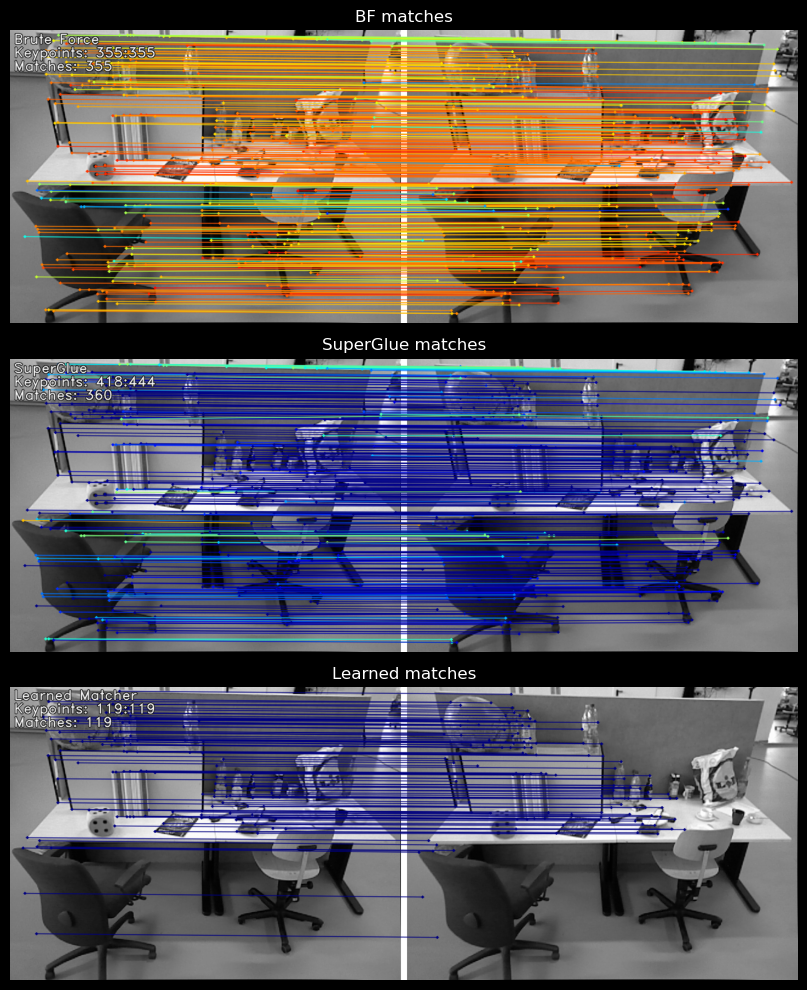

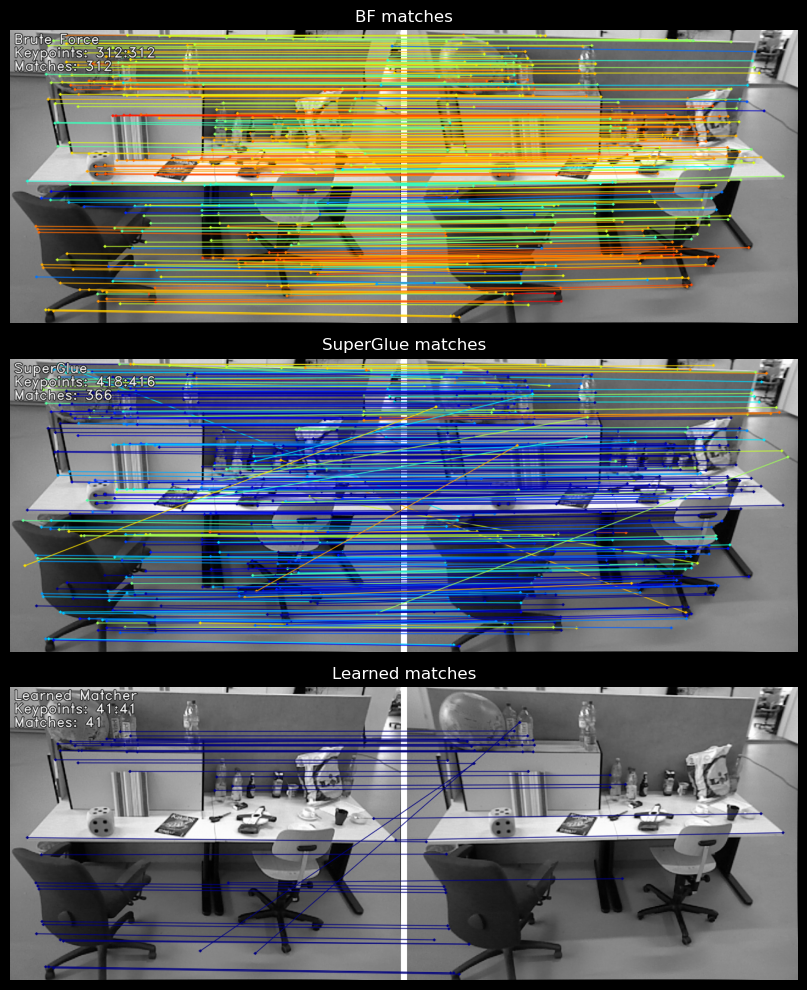

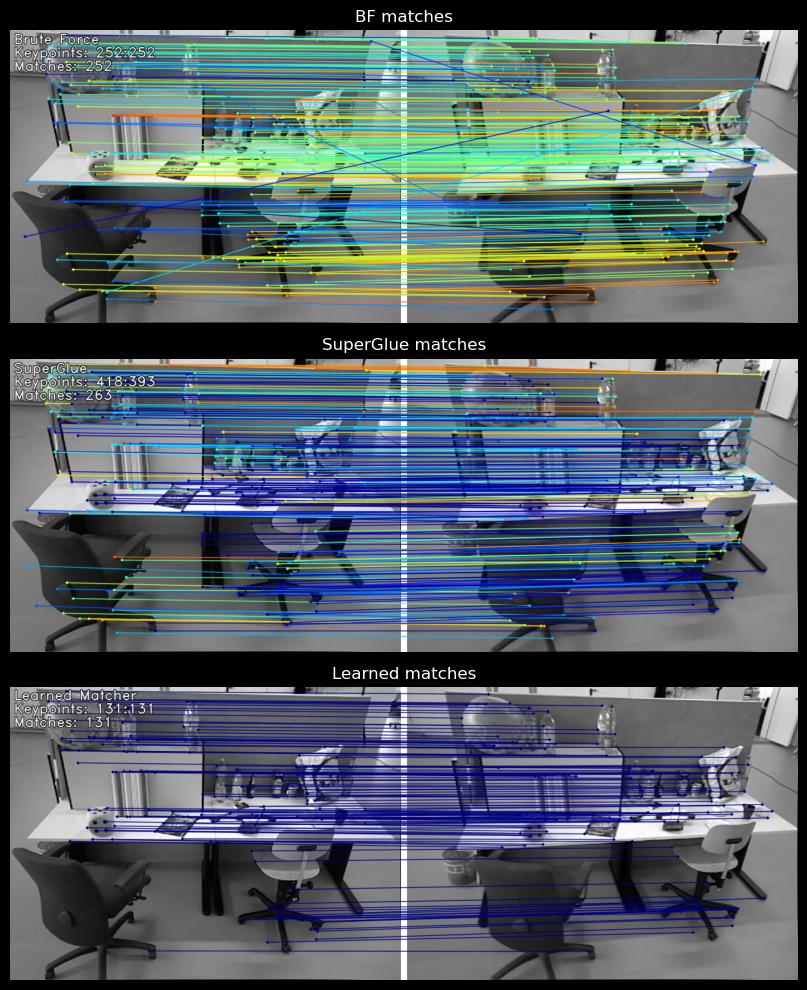

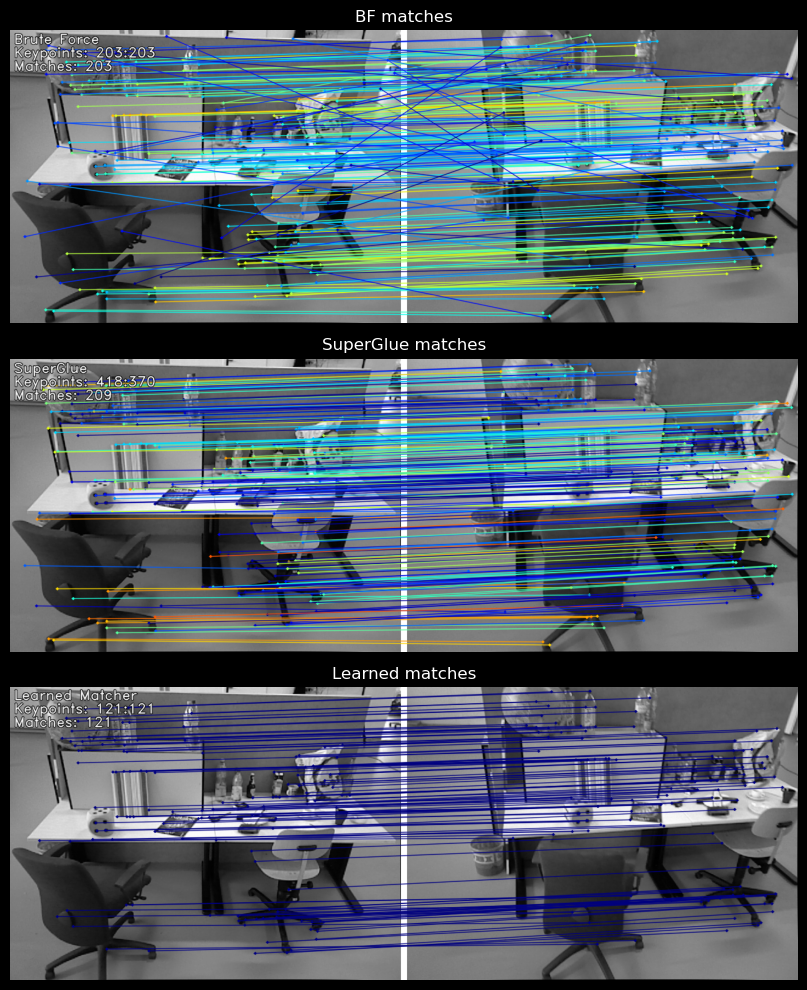

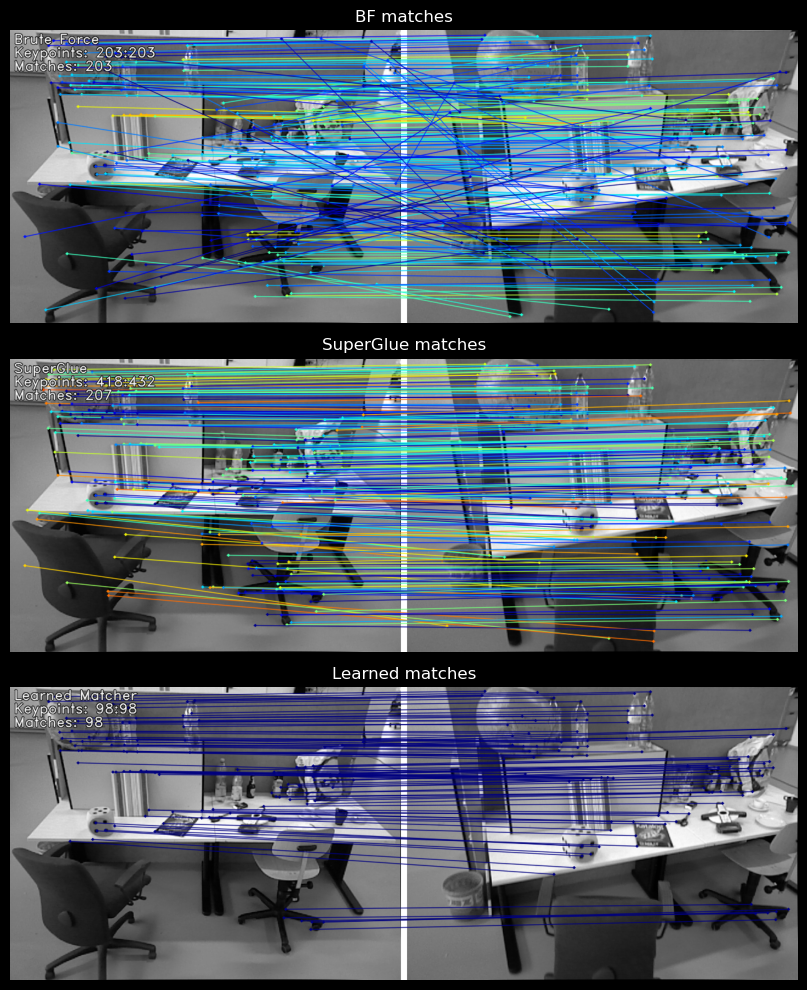

...

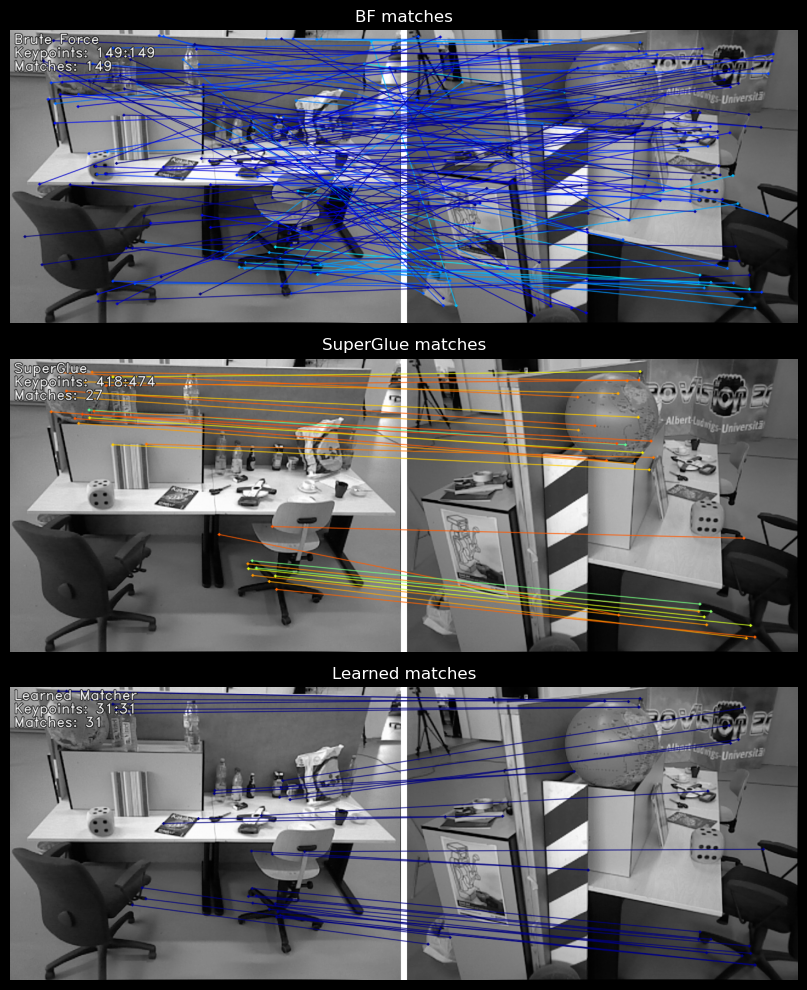

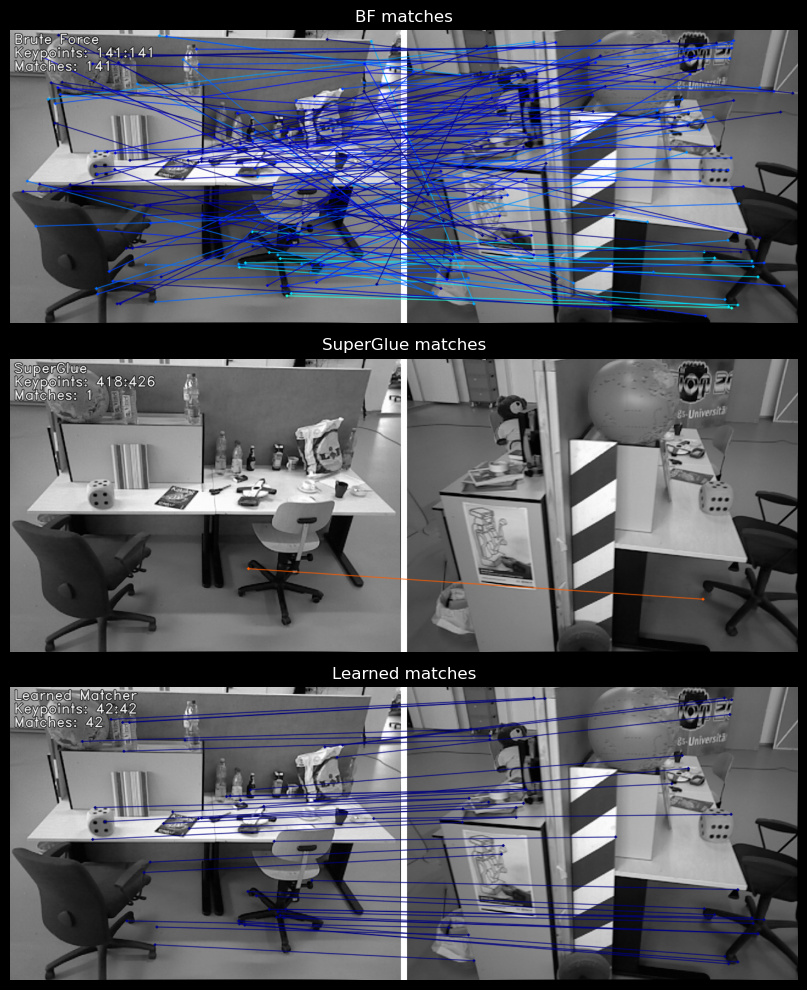

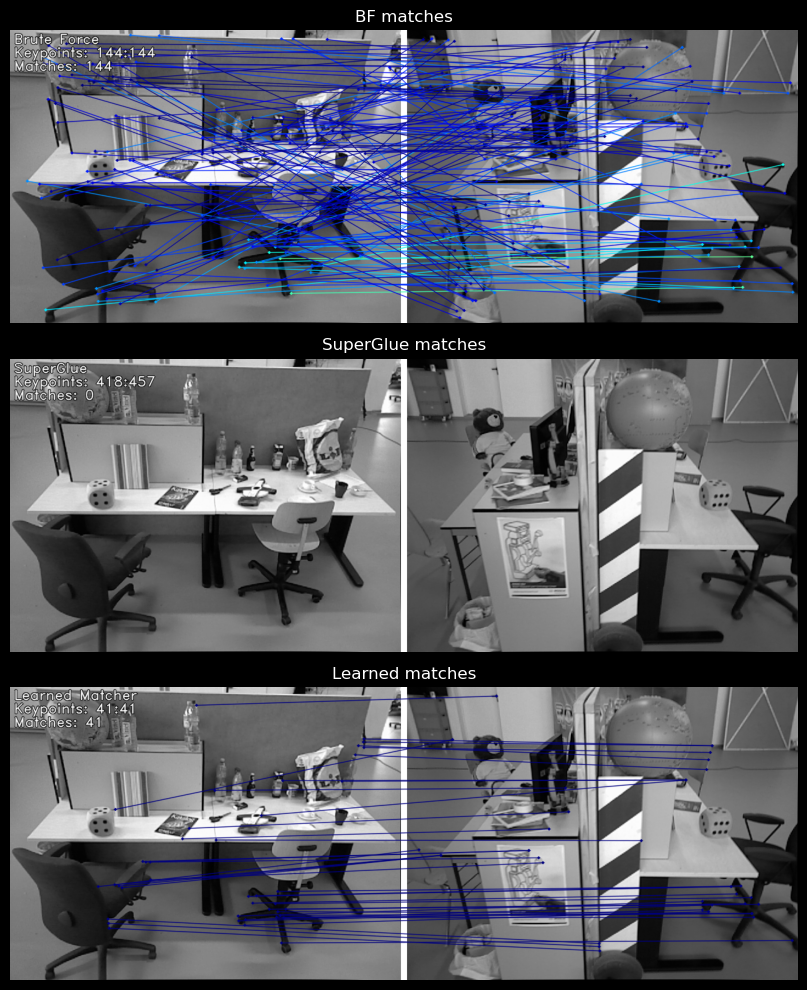

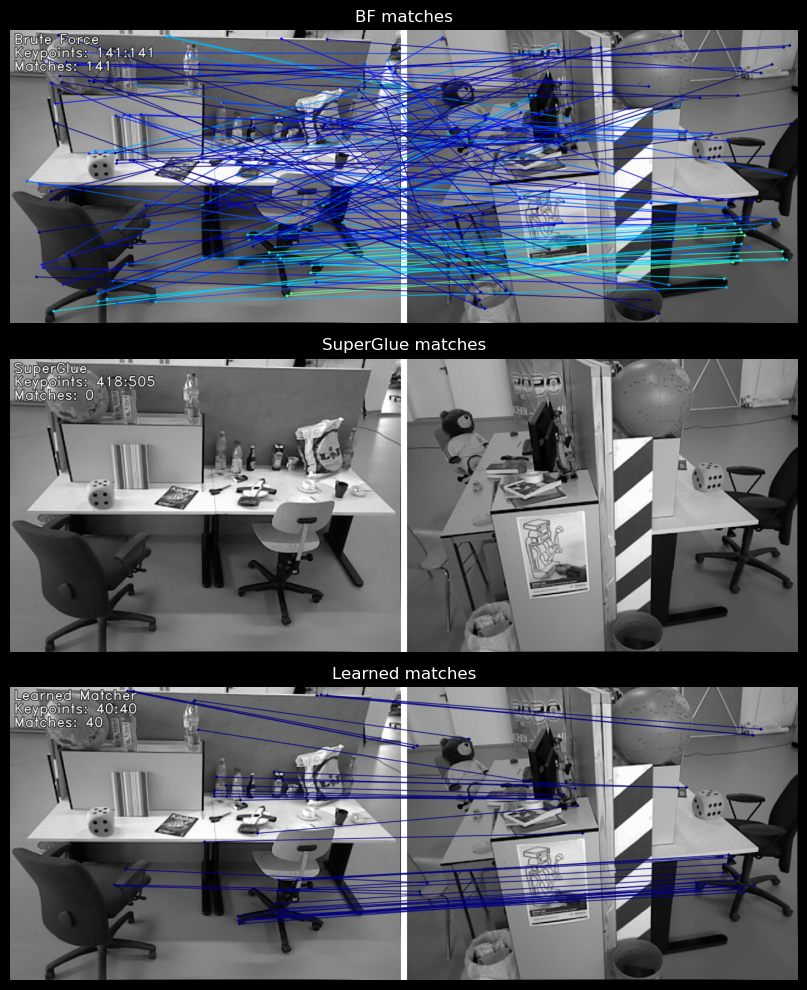

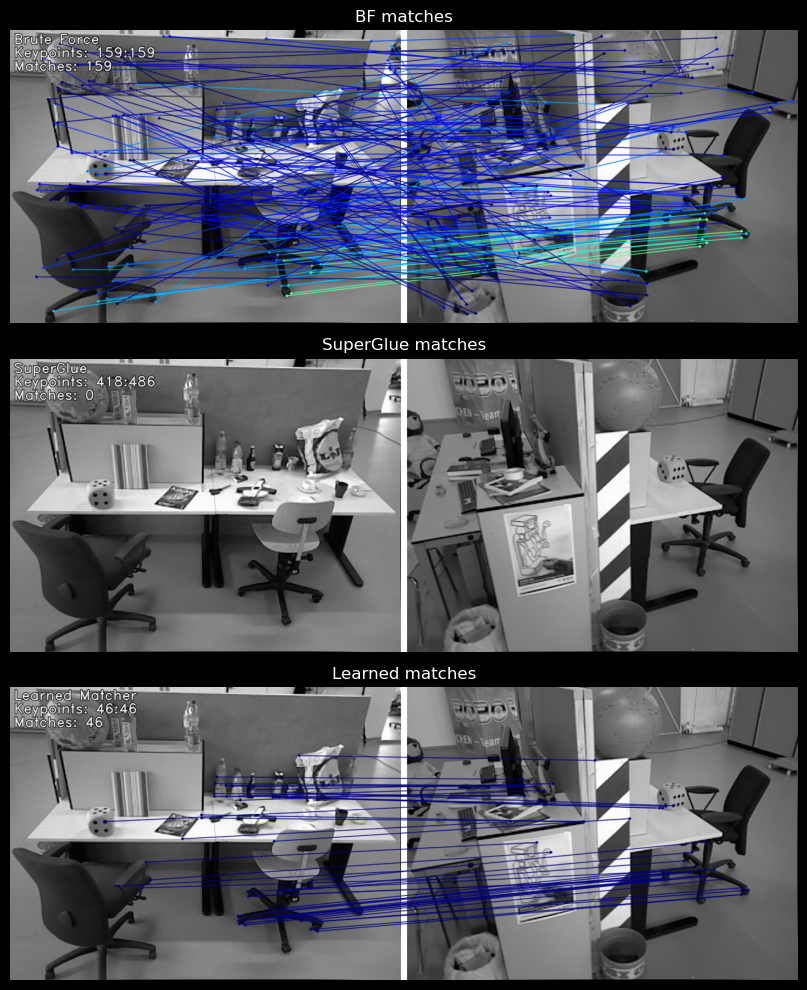

In [17]:
input = '/workspace/SuperGluePretrainedNetwork/assets/freiburg_sequence/'
vs = VideoStreamer(input, opt.resize, opt.skip, opt.image_glob)

keys = ['keypoints', 'scores', 'descriptors']

# First frame
frame, ret = vs.next_frame()
frame_tensor = frame2tensor(frame, device)
scores, descriptors = SuperPointNet({'image': frame_tensor})
prediction_ref = postporcessing_superpoint(
    scores, descriptors, SuperPointNet.config)
last_data = {k+'0': prediction_ref[k] for k in keys}
last_data['image0'] = frame_tensor
last_frame = frame
last_image_id = 0


# Loop over the frames
while True:
    # Get the next frame
    frame, ret = vs.next_frame()
    if not ret:
        break
    stem0, stem1 = last_image_id, vs.i - 1

    # Convert to tensor
    frame_tensor = frame2tensor(frame, device)

    scores, descriptors = SuperPointNet({'image': frame_tensor})
    prediction = postporcessing_superpoint(
        scores, descriptors, SuperPointNet.config)
    prediction_data = {k+'1': v for k, v in prediction.items()}
    prediction_data['image1'] = frame_tensor

    data_to_match = {**last_data, **prediction_data}

    ### Sugerglue matching ###
    sg_matching = superglue_match(data_to_match, SuperGlueNet)
    sg_kpts0 = last_data['keypoints0'][0].cpu().numpy()
    sg_kpts1 = sg_matching['keypoints1'][0].cpu().numpy()
    sg_matches = sg_matching['matches0'][0].cpu().numpy()
    sg_confidence = sg_matching['matching_scores0'][0].detach().cpu().numpy()
    
    sg_valid = sg_matches > -1
    sg_mkpts0 = sg_kpts0[sg_valid]
    sg_mkpts1 = sg_kpts1[sg_matches[sg_valid]]
    sg_color = cm.jet(sg_confidence[sg_valid])
    sg_text = [
        'SuperGlue',
        'Keypoints: {}:{}'.format(len(sg_kpts0), len(sg_kpts1)),
        'Matches: {}'.format(len(sg_mkpts0))
    ]
    
    sg_matched_image = make_matching_plot_fast(
        last_frame, frame, sg_kpts0, sg_kpts1, sg_mkpts0, sg_mkpts1, sg_color, sg_text,
        path=None, show_keypoints=opt.show_keypoints, small_text=[])

    ### Brute-force matching ###
    bf_kp1, bf_kp2, bf_matches = bf_match_descriptors(
        last_data, prediction_data)
    # H, inliers = compute_homography(bf_kp1, bf_kp2)

    # Convert matched keypoints to cv2.KeyPoint objects
    # bf_kp1_cv2 = convert_to_cv2_keypoints(bf_kp1)
    # bf_kp2_cv2 = convert_to_cv2_keypoints(bf_kp2)

    bf_matches = [
        cv2.DMatch(_queryIdx=i, _trainIdx=m.trainIdx, _distance=m.distance)
        for i, m in enumerate(bf_matches)
        # if m.trainIdx < len(bf_kp2)
    ]
    # bf_matched_image = cv2.drawMatches(
    #     last_frame, bf_kp1_cv2, frame, bf_kp2_cv2, bf_matches,
    #     None, matchColor=(0, 255, 0), singlePointColor=(0, 0, 255)
    # )

    bf_text = [
        'Brute Force',
        'Keypoints: {}:{}'.format(len(bf_kp1), len(bf_kp2)),
        'Matches: {}'.format(len(bf_matches))
    ]
    bf_color = cm.jet(np.array([m.distance for m in bf_matches]))
    
    bf_matched_image = make_matching_plot_fast(
        last_frame, frame, np.array(bf_kp1), np.array(bf_kp2), np.array(bf_kp1), np.array(bf_kp2), bf_color, bf_text,
        path=None, show_keypoints=opt.show_keypoints, small_text=[])
    


    ### Learned matcher ###
    lm_corr1, lm_corr2, lm_draw_matches, lm_weights = learned_matcher(
        last_data, prediction_data)

    # lm_matched_image = cv2.drawMatches(last_frame, lm_corr1, frame, lm_corr2, draw_matches, None,
    #                              matchColor=(0, 255, 0),
    #                              singlePointColor=(0, 0, 255),
    #                              flags=4
    #                              )
    
    lm_text = [
        'Learned Matcher',
        'Keypoints: {}:{}'.format(len(lm_corr1), len(lm_corr2)),
        'Matches: {}'.format(len(lm_draw_matches))
    ]
    lm_color = cm.jet(np.array(lm_weights))
    
    lm_matched_image = make_matching_plot_fast(
        last_frame, frame, lm_corr1, lm_corr2, lm_corr1, lm_corr2, lm_color, lm_text,
        path=None, show_keypoints=opt.show_keypoints, small_text=[])

    



    plt.figure(figsize=(20, 10))
    plt.subplot(3, 1, 1)
    plt.imshow(bf_matched_image)
    plt.axis('off')
    plt.title('BF matches')
    plt.subplot(3, 1, 2)
    plt.imshow(sg_matched_image)
    plt.axis('off')
    plt.title('SuperGlue matches')
    plt.subplot(3, 1, 3)
    plt.imshow(lm_matched_image)
    plt.axis('off')
    plt.title('Learned matches')
    plt.tight_layout()

    plt.show()

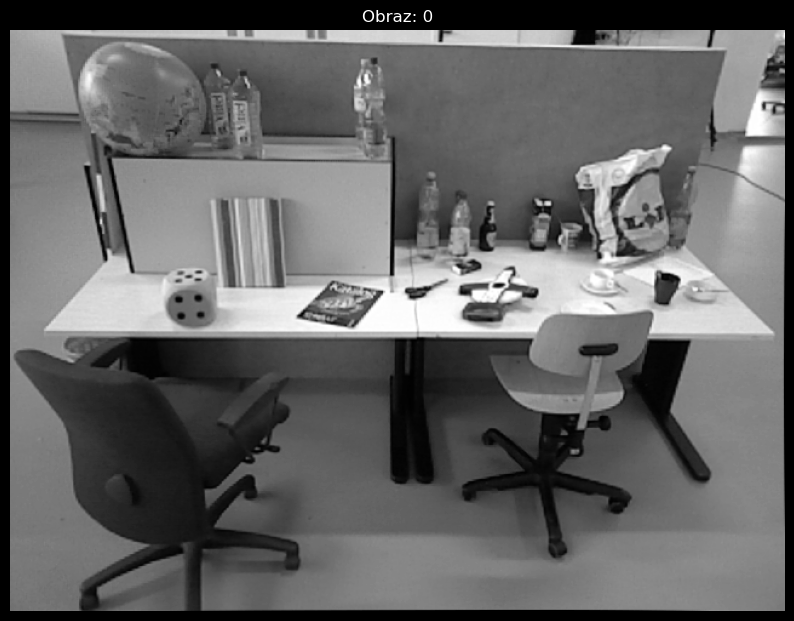

In [18]:
plt.figure(figsize=(10, 10))
plt.imshow(last_frame,cmap='gray')
plt.title(f"Obraz: {last_image_id}")
plt.axis('off')  # Ukrycie osi
plt.show()
# plt.figure(figsize=(10, 10))
# plt.imshow(out, cmap='gray')
# # plt.title(f"Obraz: {path}")
# plt.axis('off')  # Ukrycie osi
# plt.show()